# Covid19 - Brazil Basic Analysis
- by Marcelo Rovai
- 26 March 2020

## Main Libraries and setup

In [44]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import geopandas as gpd
from shapely.geometry import Point, Polygon
from unicodedata import normalize

In [45]:
pd.set_option('display.float_format', lambda x: '%.f' % x)
sns.set(context='paper', style='ticks', palette='inferno')
sns.mpl.rc("figure", figsize=(10, 6))
mpl.rcParams['figure.dpi']= 150

pd.options.display.float_format = '{:,}'.format

## Datasets

### Covid19

Confirmed cases by day, using information from the news. Covid19br dataset is available at GitHub https://github.com/wcota/covid19br. <br>
Thanks to [Wesley Cota](https://wesleycota.com), PhD candidate - Complex Networks/Physics (Universidade Federal de Viçosa - Brazil and Universidad de Zaragoza - Spain).

More information: https://wcota.me/covid19br

In [46]:
ls ../data

Brasil_Dados_Gerais_Estados_IBGE.xlsx
CV_City_Mar26.xlsx
CV_City_Mar27.xlsx
CV_City_Mar28.xlsx
IBGE_Brazil_Population_Estimation_2019.xlsx
Lista_de_municípios_brasileiros_por_área_decrescente.pdf
README.md
_control.csv
brasil_city_pop.csv
brazil_municipalities_data.csv
brazil_municipalities_data.xlsx
cases-brazil-cities-26-03-20.csv
cases-brazil-cities-27-03-20.csv
cases-brazil-cities-28-03-20.csv
cases-brazil-cities-time.csv
cases-brazil-cities.csv
cases-brazil-states.csv
cases-brazil-total.csv
cases-gps.csv
gps_cities.csv
plataforma-saude-gov-br-novocoronavirus.csv
sources.csv


In [47]:
dt_tm = pd.read_csv('../data/cases-brazil-cities-time.csv')
dt_tm.shape

(724, 6)

In [48]:
dt_tm.head()

,date,country,state,city,newCases,totalCases
0,2020-02-25,Brazil,SP,São Paulo/SP,1,1
1,2020-02-25,Brazil,TOTAL,TOTAL,1,1
2,2020-02-29,Brazil,SP,São Paulo/SP,1,2
3,2020-02-29,Brazil,TOTAL,TOTAL,1,2
4,2020-03-04,Brazil,SP,São Paulo/SP,1,3


In [49]:
dt_tm.tail()

,date,country,state,city,newCases,totalCases
719,2020-03-21,Brazil,SP,São José dos Campos/SP,0,1
720,2020-03-21,Brazil,SP,Hortolândia/SP,0,1
721,2020-03-21,Brazil,SP,Mogi das Cruzes/SP,0,1
722,2020-03-21,Brazil,MT,Cuiabá/MT,0,1
723,2020-03-21,Brazil,TOTAL,TOTAL,193,1205


In [50]:
df = dt_tm.groupby('date')
df.head()

,date,country,state,city,newCases,totalCases
0,2020-02-25,Brazil,SP,São Paulo/SP,1,1
1,2020-02-25,Brazil,TOTAL,TOTAL,1,1
2,2020-02-29,Brazil,SP,São Paulo/SP,1,2
3,2020-02-29,Brazil,TOTAL,TOTAL,1,2
4,2020-03-04,Brazil,SP,São Paulo/SP,1,3
...,...,...,...,...,...,...
584,2020-03-21,Brazil,ES,Vila Velha/ES,4,11
585,2020-03-21,Brazil,RJ,Rio de Janeiro/RJ,9,103
586,2020-03-21,Brazil,DF,Brasília/DF,4,112
587,2020-03-21,Brazil,AL,Maceió/AL,1,7


**Number of total cases by city** 

In [51]:
dt = pd.read_csv('../data/cases-brazil-cities-28-03-20.csv' )
dt.shape

(279, 5)

In [52]:
dt.head(2)

,country,state,city,ibgeID,totalCases
0,Brazil,SP,São Paulo/SP,3550308,1044
1,Brazil,RJ,Barra Mansa/RJ,3300407,1


In [53]:
dt.sort_values('totalCases', ascending=False)[:10]

,country,state,city,ibgeID,totalCases
0,Brazil,SP,São Paulo/SP,3550308,1044
4,Brazil,RJ,Rio de Janeiro/RJ,3304557,431
37,Brazil,CE,Fortaleza/CE,2304400,268
5,Brazil,DF,Brasília/DF,5300108,242
41,Brazil,MG,Belo Horizonte/MG,3106200,118
11,Brazil,RS,Porto Alegre/RS,4314902,107
22,Brazil,BA,Salvador/BA,2927408,78
23,Brazil,AM,Manaus/AM,1302603,75
14,Brazil,PR,Curitiba/PR,4106902,71
9,Brazil,RJ,Niterói/RJ,3303302,36


### Brazilian Population by city

Data from [IBGE - Estimativas da População](https://www.ibge.gov.br/estatisticas/sociais/populacao/9103-estimativas-de-populacao.html?edicao=25272&t=downloads)

Explanation: [Lista de municípios do Brasil por população - Wikipedia](https://pt.wikipedia.org/wiki/Lista_de_munic%C3%ADpios_do_Brasil_por_população)

In [54]:
br_pop = pd.read_excel('../data/IBGE_Brazil_Population_Estimation_2019.xlsx')
br_pop.shape

(5570, 6)

In [55]:
br_pop.head()

,UF,COD. UF,COD. MUNIC,NOME DO MUNICÍPIO,COD. IBGE,POPULAÇÃO ESTIMADA
0,RO,11,15,Alta Floresta D'Oeste,1100015,22945
1,RO,11,23,Ariquemes,1100023,107863
2,RO,11,31,Cabixi,1100031,5312
3,RO,11,49,Cacoal,1100049,85359
4,RO,11,56,Cerejeiras,1100056,16323


In [56]:
br_pop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5570 entries, 0 to 5569
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   UF                  5570 non-null   object
 1   COD. UF             5570 non-null   int64 
 2   COD. MUNIC          5570 non-null   int64 
 3   NOME DO MUNICÍPIO   5570 non-null   object
 4   COD. IBGE           5570 non-null   int64 
 5   POPULAÇÃO ESTIMADA  5570 non-null   int64 
dtypes: int64(4), object(2)
memory usage: 261.2+ KB


In [57]:
print('Number of Brazilian cities: {:,}'.format(len(br_pop)))
print('Total Brazilian population: {:,}'.format(br_pop['POPULAÇÃO ESTIMADA'].sum()))

Number of Brazilian cities: 5,570
Total Brazilian population: 210,147,125


## GeoData

In [58]:
!ls ../geo_data

BRMUE250GC_SIR.cpg BRMUE250GC_SIR.shp Municipios
BRMUE250GC_SIR.dbf BRMUE250GC_SIR.shx estados
BRMUE250GC_SIR.prj Brasil             out_data


### Brazil Overview

In [59]:
br_shp = gpd.read_file('../geo_data/Brasil/UFEBRASIL.shp')
br_shp.shape

(27, 5)

In [60]:
br_shp.to_crs(epsg=3395)

,ID,CD_GEOCODU,NM_ESTADO,NM_REGIAO,geometry
0,1,11,RONDÔNIA,NORTE,"POLYGON ((-7049552.568 -884921.431, -7026306.2..."
1,2,12,ACRE,NORTE,"POLYGON ((-8146641.462 -813371.931, -8141550.8..."
2,3,13,AMAZONAS,NORTE,"POLYGON ((-7494705.886 224481.731, -7493674.00..."
3,4,14,RORAIMA,NORTE,"POLYGON ((-6701489.738 582932.683, -6701242.40..."
4,5,15,PARÁ,NORTE,"MULTIPOLYGON (((-6117485.438 285788.088, -6115..."
5,6,16,AMAPÁ,NORTE,"MULTIPOLYGON (((-5697298.631 442670.645, -5697..."
6,1,17,TOCANTINS,NORTE,"POLYGON ((-5383275.007 -572466.154, -5382648.4..."
7,1,21,MARANHÃO,NORDESTE,"MULTIPOLYGON (((-5102967.077 -115610.219, -510..."
8,1,22,PIAUÍ,NORDESTE,"POLYGON ((-4647148.634 -310120.100, -4646743.5..."
9,2,23,CEARÁ,NORDESTE,"POLYGON ((-4582692.913 -494482.823, -4582155.1..."


In [61]:
br_shp.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 27 entries, 0 to 26
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   ID          27 non-null     int64   
 1   CD_GEOCODU  27 non-null     object  
 2   NM_ESTADO   27 non-null     object  
 3   NM_REGIAO   27 non-null     object  
 4   geometry    27 non-null     geometry
dtypes: geometry(1), int64(1), object(3)
memory usage: 1.2+ KB


In [62]:
br_shp.rename(columns={'CD_GEOCODU': 'COD. UF'}, inplace=True)
br_shp.head(2)

,ID,COD. UF,NM_ESTADO,NM_REGIAO,geometry
0,1,11,RONDÔNIA,NORTE,"POLYGON ((-63.32721 -7.97672, -63.11838 -7.977..."
1,2,12,ACRE,NORTE,"POLYGON ((-73.18253 -7.33550, -73.13680 -7.352..."


In [63]:
br_shp['COD. UF'] = br_shp['COD. UF'].astype('int64')

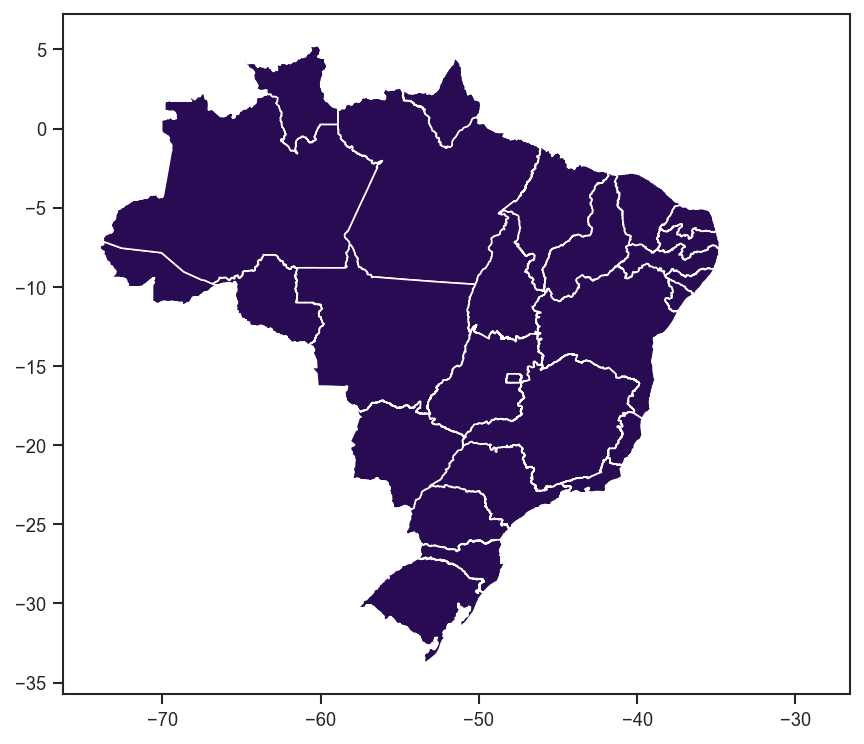

In [64]:
br_shp.plot();

### Brasil Municipalities - IBGE

In [65]:
mun_shp = gpd.read_file('../geo_data/BRMUE250GC_SIR.shp', encoding = 'utf-8')
mun_shp.shape

(5572, 3)

In [66]:
mun_shp.head(2)

,NM_MUNICIP,CD_GEOCMU,geometry
0,CACHOEIRA DO PIRIÁ,1501956,"POLYGON ((-46.31955 -1.75518, -46.31990 -1.755..."
1,SÃO JOSÉ DOS BASÍLIOS,2111250,"POLYGON ((-44.63409 -5.03498, -44.63407 -5.034..."


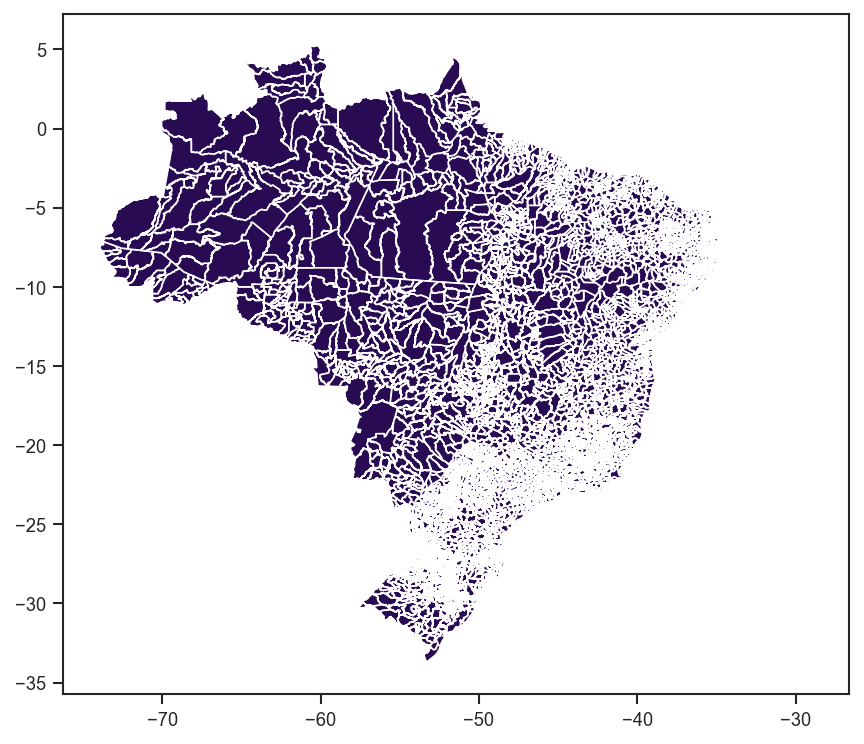

In [67]:
mun_shp.plot();

In [68]:
mun_shp.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5572 entries, 0 to 5571
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   NM_MUNICIP  5572 non-null   object  
 1   CD_GEOCMU   5572 non-null   object  
 2   geometry    5572 non-null   geometry
dtypes: geometry(1), object(2)
memory usage: 130.7+ KB


In [69]:
mun_shp['CD_GEOCMU'] = mun_shp['CD_GEOCMU'].astype('int64')

## Creating a single Dataset

In [70]:
br_pop.head(2)

,UF,COD. UF,COD. MUNIC,NOME DO MUNICÍPIO,COD. IBGE,POPULAÇÃO ESTIMADA
0,RO,11,15,Alta Floresta D'Oeste,1100015,22945
1,RO,11,23,Ariquemes,1100023,107863


In [71]:
mun_shp.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5572 entries, 0 to 5571
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   NM_MUNICIP  5572 non-null   object  
 1   CD_GEOCMU   5572 non-null   int64   
 2   geometry    5572 non-null   geometry
dtypes: geometry(1), int64(1), object(1)
memory usage: 130.7+ KB


In [72]:
mun_shp.rename(columns = {'CD_GEOCMU': 'COD. IBGE'}, inplace=True)

### Calculating aprox. city areas in m2
- For a real area calculation: [Lista de municípios brasileiros por área decrescente - Wikipedia](https://pt.wikipedia.org/wiki/Lista_de_munic%C3%ADpios_brasileiros_por_área_decrescente)

In [73]:
tost = mun_shp.copy()
tost = tost.to_crs(epsg=3395)
print (tost.crs)
tost.head(2)

{'init': 'epsg:3395', 'no_defs': True}


,NM_MUNICIP,COD. IBGE,geometry
0,CACHOEIRA DO PIRIÁ,1501956,"POLYGON ((-5156268.978 -194108.102, -5156307.2..."
1,SÃO JOSÉ DOS BASÍLIOS,2111250,"POLYGON ((-4968644.429 -557466.288, -4968641.9..."


In [74]:
tost["area"] = tost['geometry'].area/ 10**6
tost.head(2)

,NM_MUNICIP,COD. IBGE,geometry,area
0,CACHOEIRA DO PIRIÁ,1501956,"POLYGON ((-5156268.978 -194108.102, -5156307.2...","2,422.5106761430625"
1,SÃO JOSÉ DOS BASÍLIOS,2111250,"POLYGON ((-4968644.429 -557466.288, -4968641.9...",355.9684085285142


In [75]:
del tost['NM_MUNICIP']
del tost['geometry']
tost.head(2)

,COD. IBGE,area
0,1501956,"2,422.5106761430625"
1,2111250,355.9684085285142


In [76]:
mun_shp = pd.merge(tost, mun_shp, on='COD. IBGE')
mun_shp.shape

(5572, 4)

In [77]:
br_cities = pd.merge(br_pop, mun_shp, on='COD. IBGE')
br_cities.shape

(5570, 9)

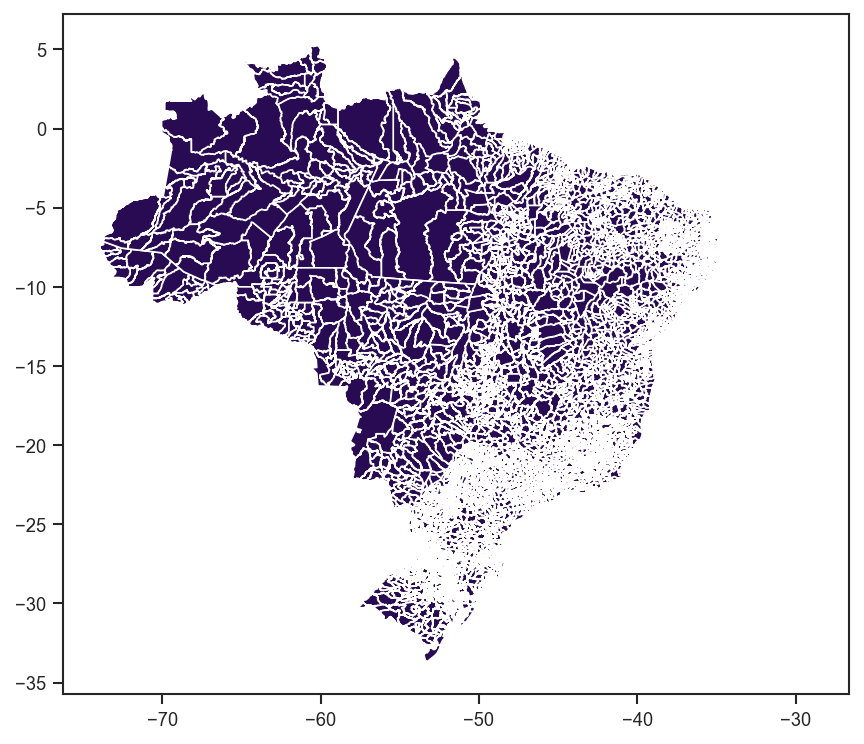

In [78]:
br_cities = gpd.GeoDataFrame(br_cities, crs='4326')
br_cities.plot();

In [79]:
del br_cities['COD. MUNIC']
del br_cities['NM_MUNICIP']

In [80]:
br_cities.rename(columns={'area': 'AREA [KMˆ2]'}, inplace=True)
br_cities['AREA [KMˆ2]'] = round(br_cities['AREA [KMˆ2]'], 2)
br_cities['DENS. DEMOG. [hab/kmˆ2]'] = round(br_cities['POPULAÇÃO ESTIMADA'] / br_cities['AREA [KMˆ2]'], 2)

In [81]:
br_cities.head(2)

,UF,COD. UF,NOME DO MUNICÍPIO,COD. IBGE,POPULAÇÃO ESTIMADA,AREA [KMˆ2],geometry,DENS. DEMOG. [hab/kmˆ2]
0,RO,11,Alta Floresta D'Oeste,1100015,22945,"7,410.66","POLYGON ((-62.23224 -11.90804, -62.22630 -11.8...",3.1
1,RO,11,Ariquemes,1100023,107863,"4,561.93","POLYGON ((-63.57327 -9.78326, -63.57304 -9.781...",23.64


In [82]:
print('Number of Brazilian Cities: {:,}'.format(len(br_cities.index)))
print('Total Brazilian Population: {:,}'.format(br_cities['POPULAÇÃO ESTIMADA'].sum()))
print('Total Brazilian Territory : {:,} km2 (aprox.)'.format(round(br_cities['AREA [KMˆ2]'].sum())))

Number of Brazilian Cities: 5,570
Total Brazilian Population: 210,147,125
Total Brazilian Territory : 8,985,590.0 km2 (aprox.)


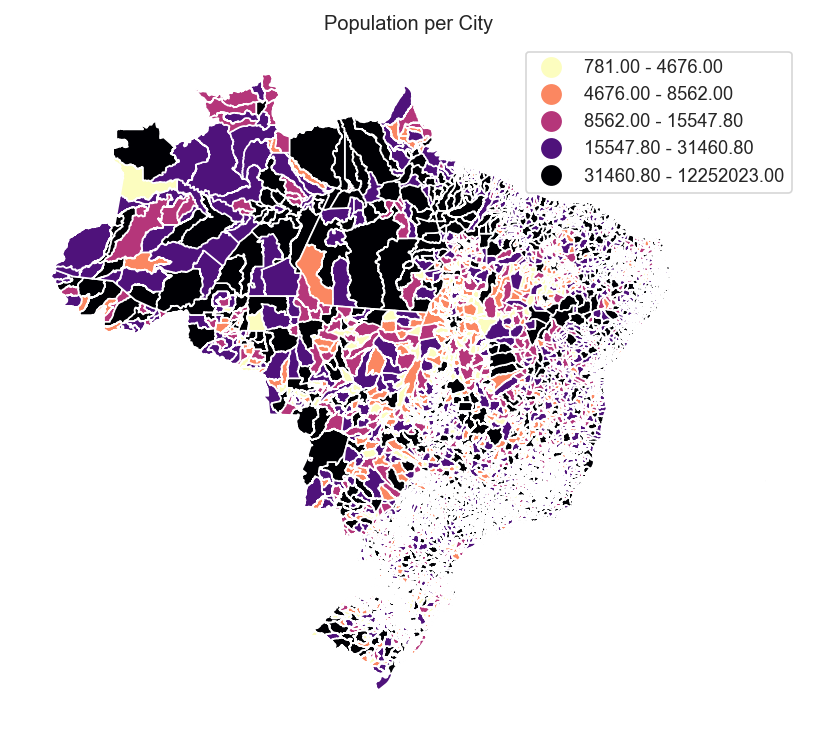

In [83]:
ax = br_cities.plot(column='POPULAÇÃO ESTIMADA', cmap='magma_r', scheme='quantiles', legend=True)
plt.title("Population per City");
ax.set_axis_off()

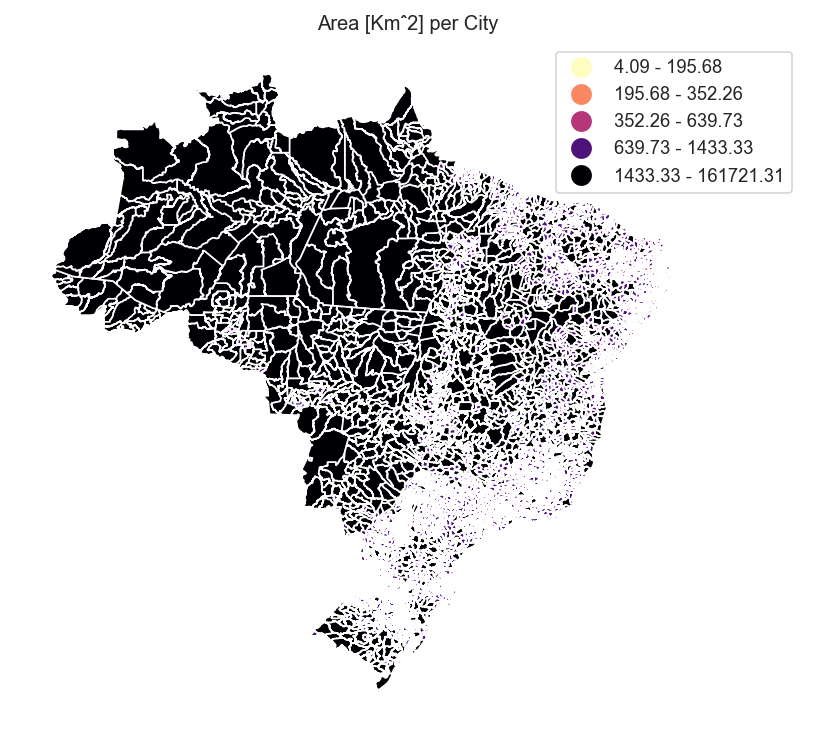

In [41]:
ax = br_cities.plot(column='AREA [KMˆ2]', cmap='magma_r', scheme='quantiles', legend=True)
plt.title("Area [Kmˆ2] per City");
ax.set_axis_off()

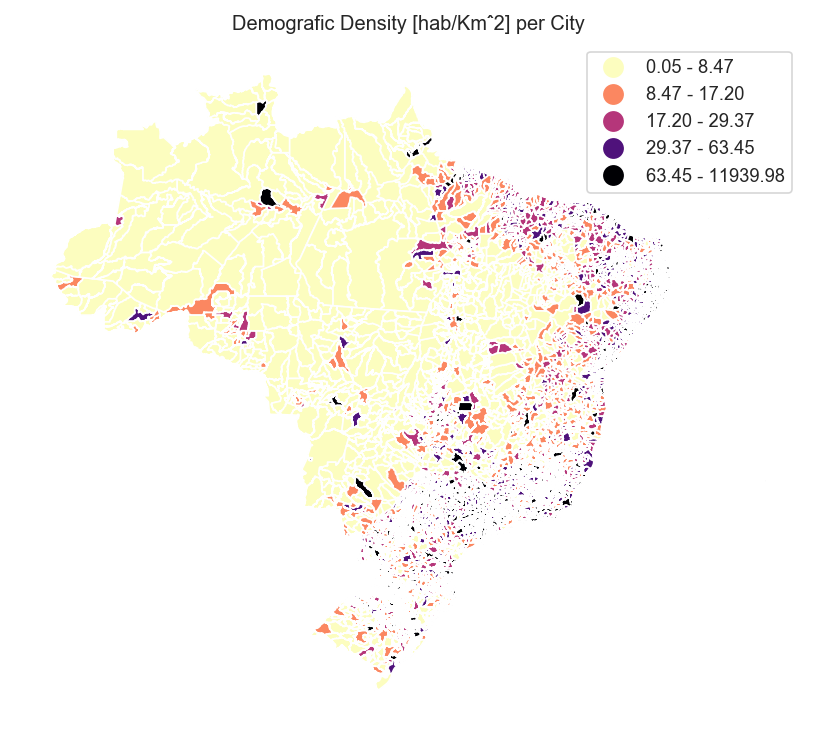

In [42]:
ax = br_cities.plot(column='DENS. DEMOG. [hab/kmˆ2]', cmap='magma_r', scheme='quantiles', legend=True)
plt.title("Demografic Density [hab/Kmˆ2] per City");
ax.set_axis_off()

### Saving a CSV / Excel file

In [84]:
br_cities['LATITUDE'] = br_cities.representative_point().y
br_cities['LONGITUDE'] = br_cities.representative_point().x

In [85]:
br_cities.head(2)

,UF,COD. UF,NOME DO MUNICÍPIO,COD. IBGE,POPULAÇÃO ESTIMADA,AREA [KMˆ2],geometry,DENS. DEMOG. [hab/kmˆ2],LATITUDE,LONGITUDE
0,RO,11,Alta Floresta D'Oeste,1100015,22945,"7,410.66","POLYGON ((-62.23224 -11.90804, -62.22630 -11.8...",3.1,-12.471074752499959,-62.13701361822207
1,RO,11,Ariquemes,1100023,107863,"4,561.93","POLYGON ((-63.57327 -9.78326, -63.57304 -9.781...",23.64,-9.978684078499953,-63.056845781515754


In [86]:
temp = br_cities.copy()
del temp['geometry']

In [46]:
temp.to_excel('../data/brazil_municipalities_data.xlsx')
temp.to_csv('../data/brazil_municipalities_data.csv')

In [87]:
br_cities_pnt = gpd.GeoDataFrame(temp, geometry=gpd.points_from_xy(temp.LONGITUDE, temp.LATITUDE))

In [88]:
br_cities_pnt[br_cities_pnt['NOME DO MUNICÍPIO'] == 'Chuí']

,UF,COD. UF,NOME DO MUNICÍPIO,COD. IBGE,POPULAÇÃO ESTIMADA,AREA [KMˆ2],DENS. DEMOG. [hab/kmˆ2],LATITUDE,LONGITUDE,geometry
4712,RS,43,Chuí,4305439,6704,291.48,23.0,-33.65224831399996,-53.40952147319344,POINT (-53.40952 -33.65225)


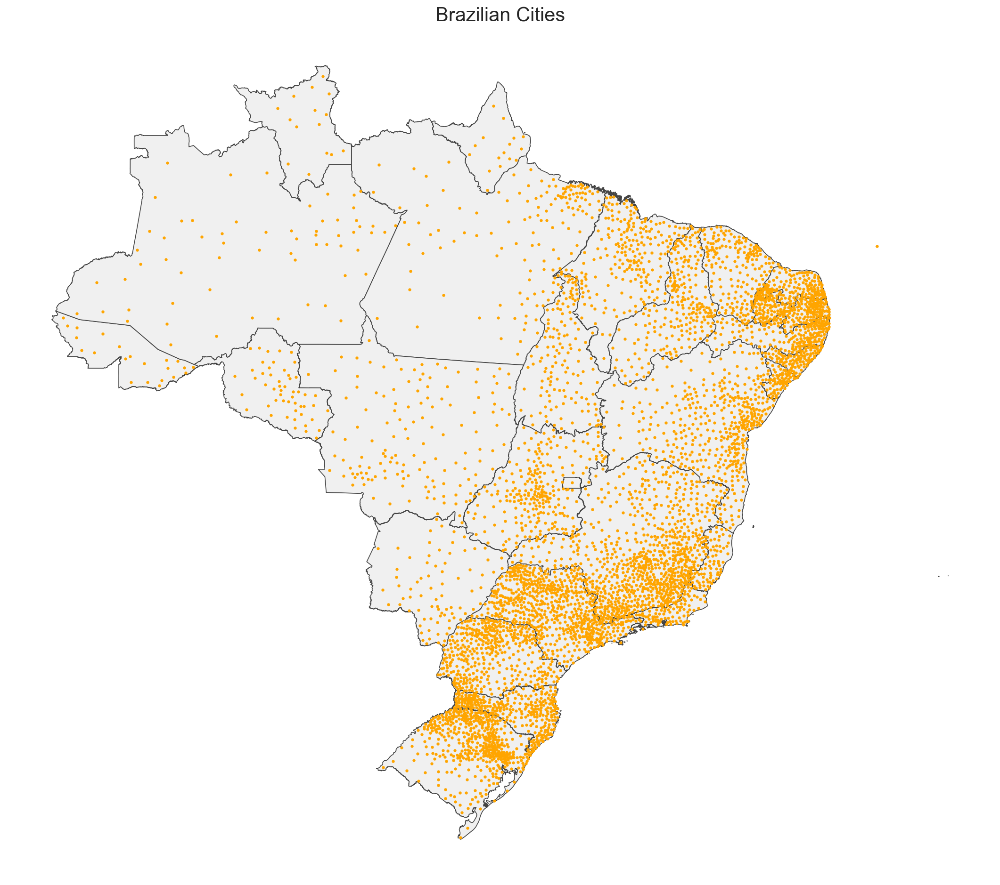

In [89]:
ax = br_shp.plot(figsize=(18, 16), color='#F0F0F0', edgecolor='#444444')
br_cities_pnt.plot(ax=ax, color="orange", markersize=5, label='City')
plt.title("Brazilian Cities", fontsize = 20);
plt.axis('off');

### Grouping State data

In [90]:
br_state = br_cities.groupby('UF', as_index=False).agg({
    'COD. UF': 'first',
    'NOME DO MUNICÍPIO': 'count',
    'POPULAÇÃO ESTIMADA': 'sum',
    'AREA [KMˆ2]': 'sum'
})
br_state.shape

(27, 5)

In [91]:
br_state.rename(columns={'NOME DO MUNICÍPIO':'QTD MUNICÍPIOS'}, inplace=True)
br_state['DENS. DEMOG. [hab/kmˆ2]'] = round(br_state['POPULAÇÃO ESTIMADA'] / br_state['AREA [KMˆ2]'], 2)
br_state['AREA [KMˆ2]'] = round(br_state['AREA [KMˆ2]'], 2)
br_state

,UF,COD. UF,QTD MUNICÍPIOS,POPULAÇÃO ESTIMADA,AREA [KMˆ2],DENS. DEMOG. [hab/kmˆ2]
0,AC,12,22,881935,"168,458.35",5.24
1,AL,27,102,3337357,"28,621.12",116.6
2,AM,13,62,4144597,"1,571,148.4",2.64
3,AP,16,16,845731,"142,618.28",5.93
4,BA,29,417,14873064,"592,928.26",25.08
5,CE,23,184,9132078,"150,137.08",60.82
6,DF,53,1,3015268,"6,217.88",484.94
7,ES,32,78,4018650,"51,875.9",77.47
8,GO,52,246,7018354,"368,391.83",19.05
9,MA,21,217,7075181,"332,594.66",21.27


In [92]:
print('Number of Brazilian Cities: {:,}'.format(br_state['QTD MUNICÍPIOS'].sum()))
print('Total Brazilian Population: {:,}'.format(br_state['POPULAÇÃO ESTIMADA'].sum()))
print('Total Brazilian Territory : {:,} km2 (aprox.)'.format(round(br_state['AREA [KMˆ2]'].sum())))

Number of Brazilian Cities: 5,570
Total Brazilian Population: 210,147,125
Total Brazilian Territory : 8,985,590.0 km2 (aprox.)


In [93]:
br_state = pd.merge(br_state, br_shp, on='COD. UF')
br_state= gpd.GeoDataFrame(br_state, crs='4326')
br_state.shape

(27, 10)

In [94]:
br_state.head(2)

,UF,COD. UF,QTD MUNICÍPIOS,POPULAÇÃO ESTIMADA,AREA [KMˆ2],DENS. DEMOG. [hab/kmˆ2],ID,NM_ESTADO,NM_REGIAO,geometry
0,AC,12,22,881935,"168,458.35",5.24,2,ACRE,NORTE,"POLYGON ((-73.18253 -7.33550, -73.13680 -7.352..."
1,AL,27,102,3337357,"28,621.12",116.6,1,ALAGOAS,NORDESTE,"POLYGON ((-35.46753 -8.81744, -35.46659 -8.817..."


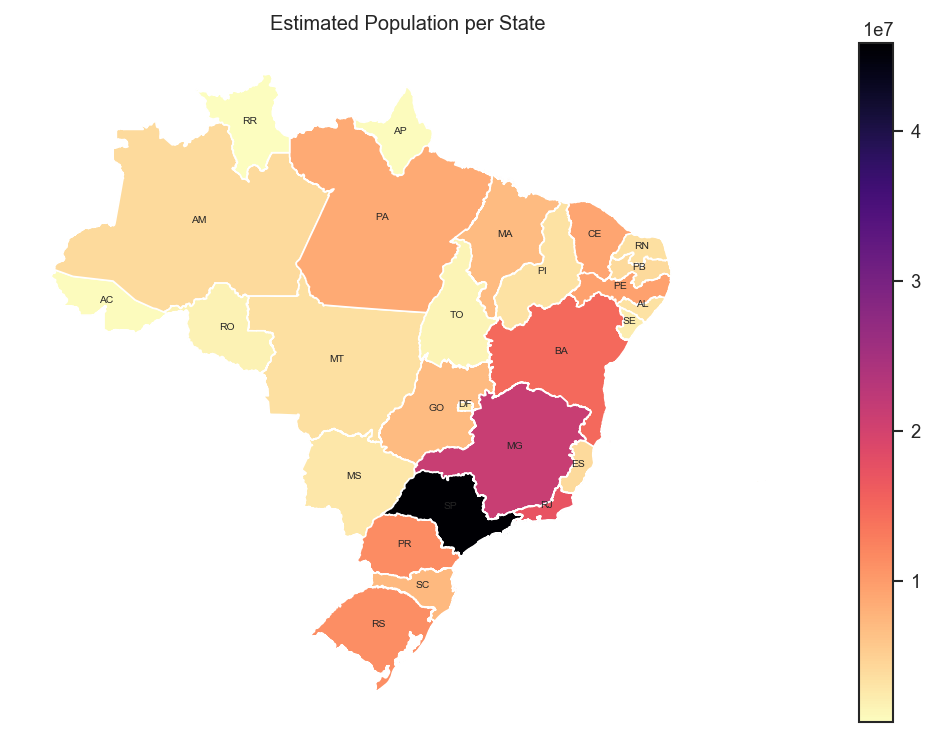

In [95]:
ax = br_state.plot(column='POPULAÇÃO ESTIMADA', cmap='magma_r', legend=True)
plt.title("Estimated Population per State");
ax.set_axis_off()
for idx, row in br_state.iterrows():
    plt.annotate(s=row['UF'], xy=(row.geometry.centroid.x, row.geometry.centroid.y),
                 horizontalalignment='center', fontsize=5);

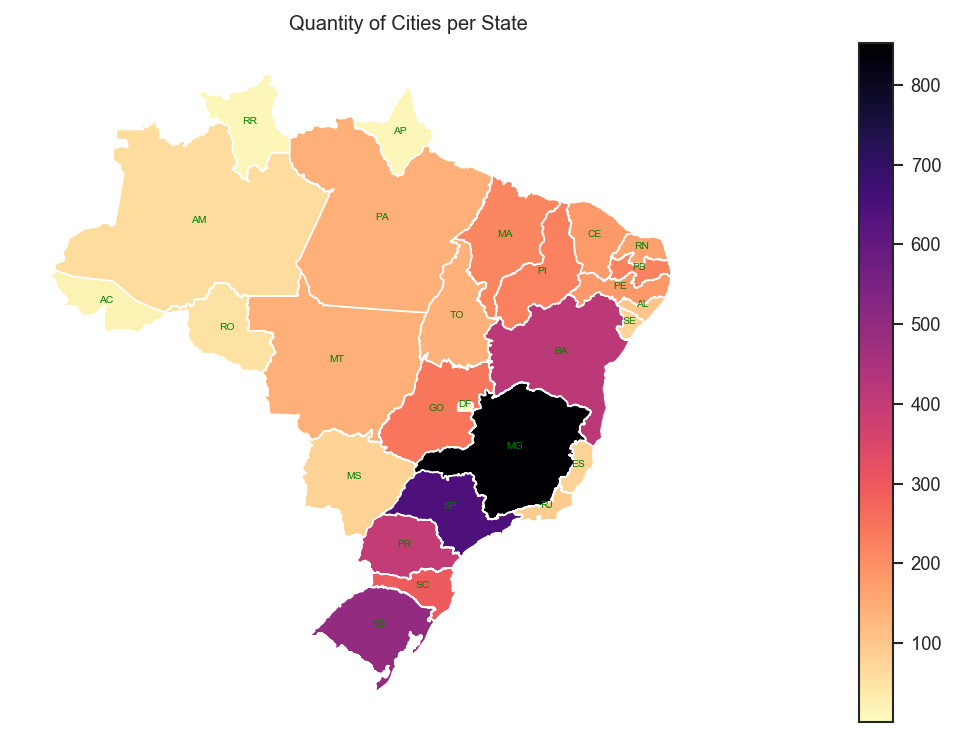

In [56]:
ax = br_state.plot(column='QTD MUNICÍPIOS', cmap='magma_r', legend=True)
plt.title("Quantity of Cities per State");
ax.set_axis_off()
for idx, row in br_state.iterrows():
    plt.annotate(s=row['UF'], xy=(row.geometry.centroid.x, row.geometry.centroid.y),
                 horizontalalignment='center', fontsize=5, color='green');

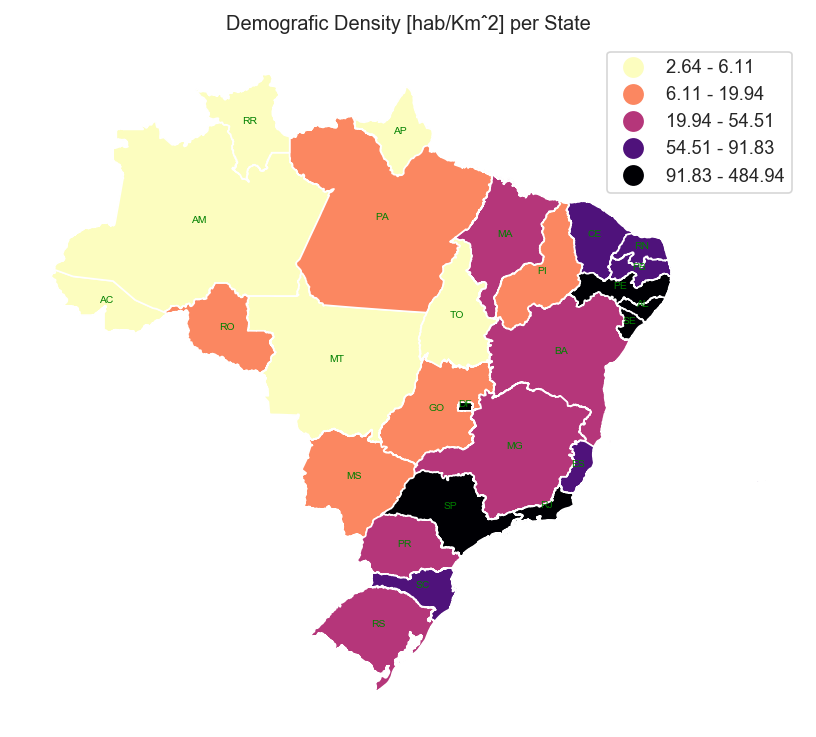

In [57]:
ax = br_state.plot(column='DENS. DEMOG. [hab/kmˆ2]', cmap='magma_r', scheme='quantiles', legend=True)
plt.title("Demografic Density [hab/Kmˆ2] per State");
ax.set_axis_off()
for idx, row in br_state.iterrows():
    plt.annotate(s=row['UF'], xy=(row.geometry.centroid.x, row.geometry.centroid.y),
                 horizontalalignment='center', fontsize=5, color='green');

## Getting POIs

OpenStreetMap data from:
http://download.geofabrik.de/south-america/brazil.html

In [58]:
!ls ../OSM

brazil-140101-free       nordeste-latest-free     sudeste-latest-free
centro-oeste-latest-free norte-latest-free        sul-latest-free


In [59]:
file = '../OSM/brazil-140101-free/gis_osm_roads_free_1.shp'

In [60]:
br_roads_shp = gpd.read_file(file, encoding = 'utf-8')
br_roads_shp.shape

(1290718, 11)

In [61]:
br_roads_shp.head(2)

,osm_id,code,fclass,name,ref,oneway,maxspeed,layer,bridge,tunnel,geometry
0,4019472,5112,trunk,Ruta 7ta Dr. Gaspar R. de Francia,7,F,0,1,T,F,"LINESTRING (-54.60279 -25.50944, -54.60416 -25..."
1,4217292,5122,residential,Rua Vinícius de Moraes,None,F,0,0,F,F,"LINESTRING (-43.20296 -22.98657, -43.20295 -22..."


In [62]:
br_roads_shp.fclass.value_counts()

residential       874698
tertiary           64479
unclassified       53063
secondary          49220
service            45163
primary            35186
track              31300
unknown            19856
footway            18487
primary_link       14935
secondary_link     11903
motorway_link      10155
trunk               9933
living_street       8932
tertiary_link       8872
motorway            7890
trunk_link          6170
path                5143
steps               5017
pedestrian          3191
track_grade2        1631
track_grade3        1386
track_grade5        1358
cycleway             902
track_grade4         846
track_grade1         695
bridleway            307
Name: fclass, dtype: int64

In [63]:
br_motorway = br_roads_shp.loc[br_roads_shp.fclass == 'motorway'].copy()
br_motorway.shape

(7890, 11)

In [64]:
br_motorway.head()

,osm_id,code,fclass,name,ref,oneway,maxspeed,layer,bridge,tunnel,geometry
16,4273875,5111,motorway,Marginal Pinheiros - Expressa,None,F,90,0,F,F,"LINESTRING (-46.72086 -23.65363, -46.72121 -23..."
18,4300267,5111,motorway,Rodovia Anhangüera,SP-330,F,0,0,F,F,"LINESTRING (-46.86832 -23.26988, -46.86829 -23..."
19,4300280,5111,motorway,Rodovia Anhangüera,SP-330,F,0,0,F,F,"LINESTRING (-46.83514 -23.40376, -46.83633 -23..."
20,4312745,5111,motorway,Rodovia dos Bandeirantes,SP-348,F,120,0,F,F,"LINESTRING (-46.80319 -23.35114, -46.80046 -23..."
21,4312746,5111,motorway,Rodovia dos Bandeirantes,SP-348,F,120,0,F,F,"LINESTRING (-46.76387 -23.41745, -46.76497 -23..."


In [65]:
br_primary = br_roads_shp.loc[br_roads_shp.fclass == 'primary'].copy()
br_primary.shape

(35186, 11)

In [66]:
br_primary.head()

,osm_id,code,fclass,name,ref,oneway,maxspeed,layer,bridge,tunnel,geometry
211,4498349,5113,primary,Avenida Nossa Senhora do Carmo,BR-356,F,0,0,F,F,"LINESTRING (-43.93331 -19.93994, -43.93323 -19..."
234,4515633,5113,primary,Avenida Presidente Carlos Luz,None,F,60,0,F,F,"LINESTRING (-43.96941 -19.88673, -43.96953 -19..."
253,4523223,5113,primary,Estrada de Itapecerica,None,F,60,0,F,F,"LINESTRING (-46.73647 -23.64285, -46.73708 -23..."
254,4523224,5113,primary,Estrada de Itapecerica,None,F,0,0,F,F,"LINESTRING (-46.73636 -23.64305, -46.73621 -23..."
345,4548568,5113,primary,BR-262,None,F,0,1,T,F,"LINESTRING (-43.89389 -19.85690, -43.89428 -19..."


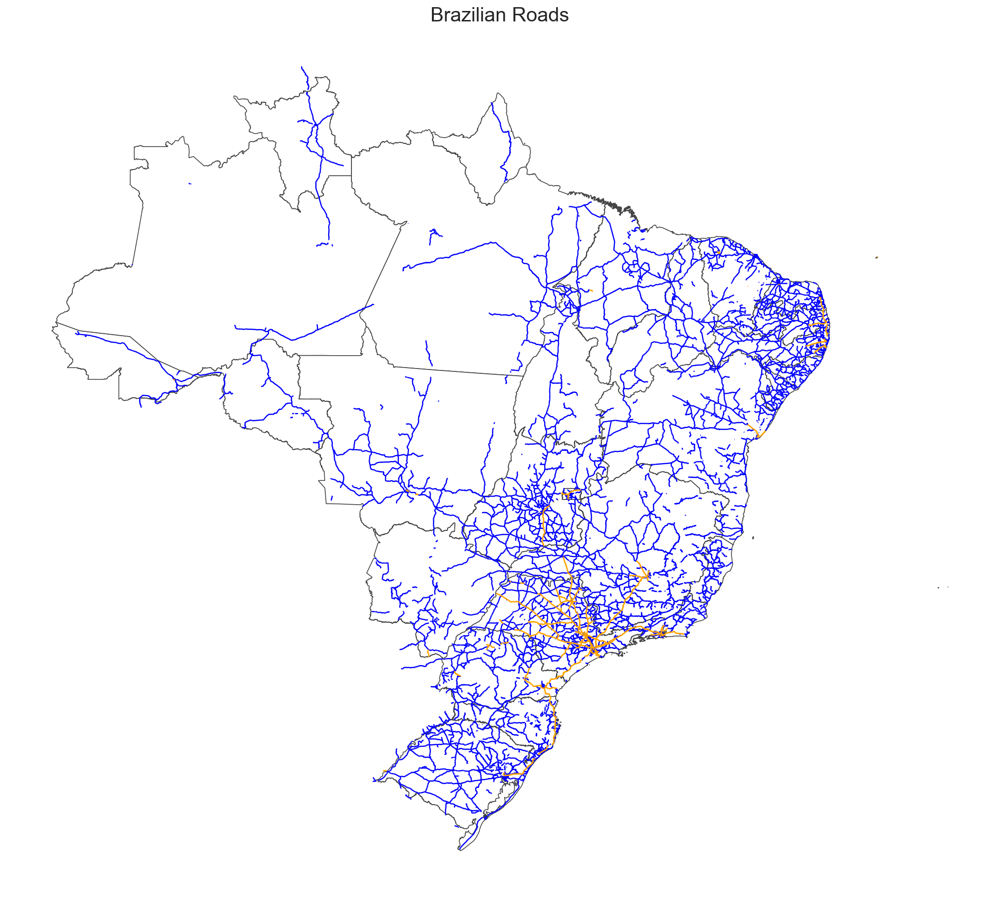

In [67]:
ax = br_shp.plot(figsize=(18, 16), color='#FFFFFF', edgecolor='#444444')
br_primary.plot(ax=ax, color="blue")
br_motorway.plot(ax=ax, color="orange", markersize=5)
plt.title("Brazilian Roads", fontsize = 20);
plt.axis('off');

### Looking Sao Paulo State

In [68]:
sp_shp = br_shp.loc[br_shp['COD. UF'] == 35].copy()
sp_shp = sp_shp.to_crs({'init': 'epsg:4326'})

In [69]:
sp_motorway = gpd.sjoin(br_motorway, sp_shp, op='intersects')

In [70]:
sp_primary = gpd.sjoin(br_primary, sp_shp, op='intersects')

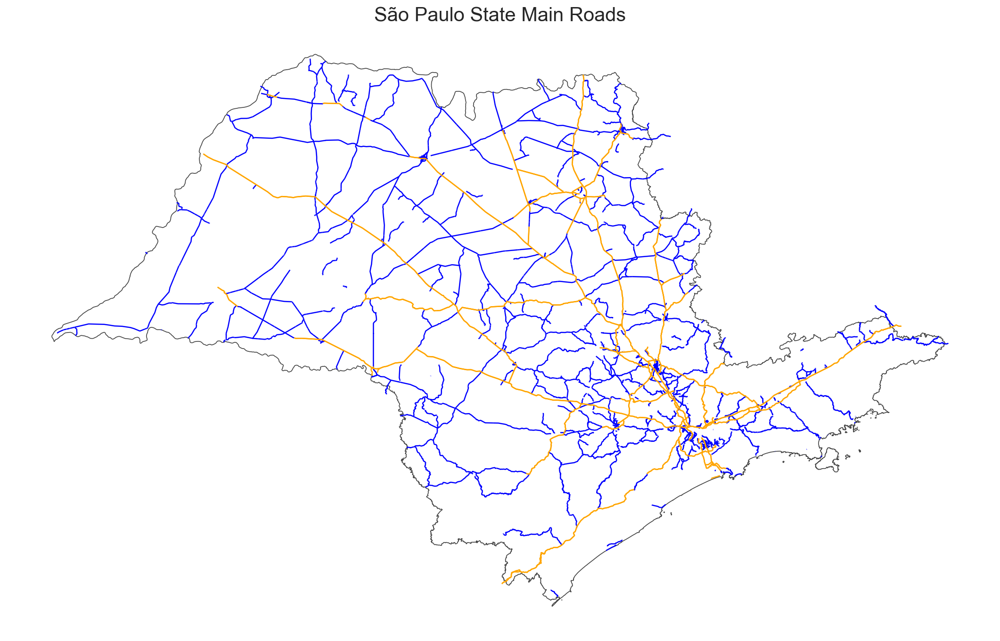

In [71]:
ax = sp_shp.plot(figsize=(18, 16), color='#FFFFFF', edgecolor='#444444')
sp_primary.plot(ax=ax, color="blue", markersize=1)
sp_motorway.plot(ax=ax, color="orange", markersize=1)
plt.title("São Paulo State Main Roads", fontsize = 20);
plt.axis('off');

### Looking Minas Gerais State

In [72]:
mg_shp = br_shp.loc[br_shp['COD. UF'] == 31].copy()
mg_shp = mg_shp.to_crs({'init': 'epsg:4326'})

In [73]:
mg_motorway = gpd.sjoin(br_motorway, mg_shp, op='intersects')

In [74]:
mg_primary = gpd.sjoin(br_primary, mg_shp, op='intersects')

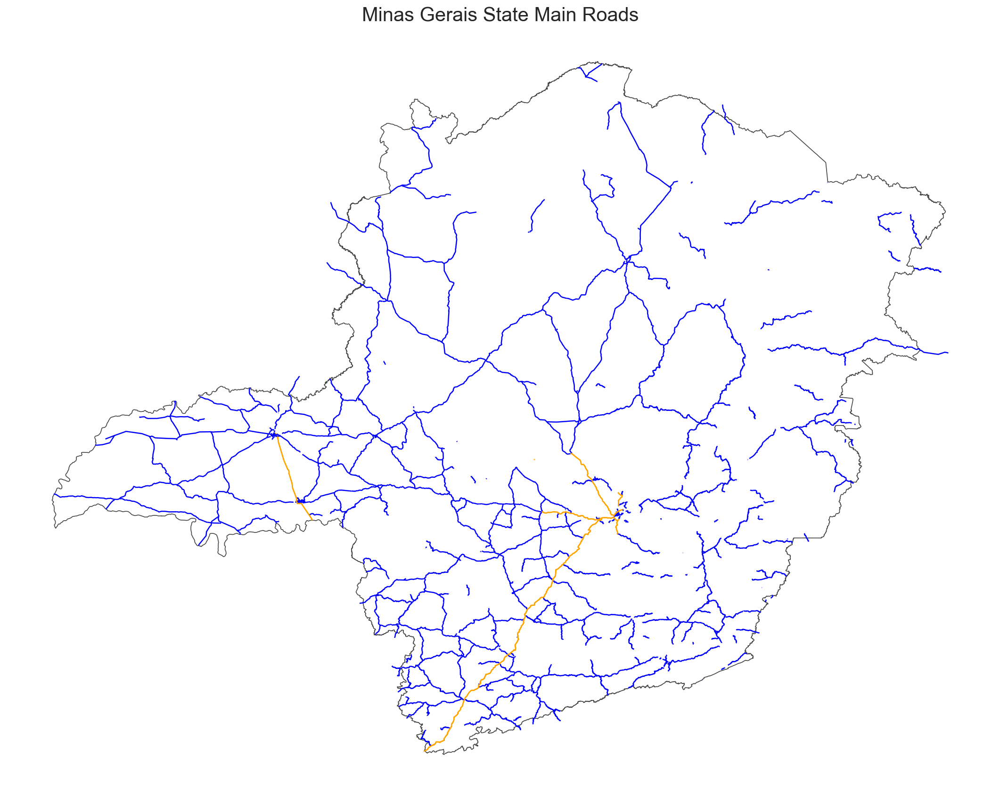

In [75]:
ax = mg_shp.plot(figsize=(18, 16), color='#FFFFFF', edgecolor='#444444')
mg_primary.plot(ax=ax, color="blue", markersize=1)
mg_motorway.plot(ax=ax, color="orange", markersize=1)
plt.title("Minas Gerais State Main Roads", fontsize = 20);
plt.axis('off');

### Looking Rio de Janeiro State

In [76]:
rj_shp = br_shp.loc[br_shp['COD. UF'] == 33].copy()
rj_shp = rj_shp.to_crs({'init': 'epsg:4326'})

In [77]:
rj_motorway = gpd.sjoin(br_motorway, rj_shp, op='intersects')

In [78]:
rj_primary = gpd.sjoin(br_primary, rj_shp, op='intersects')

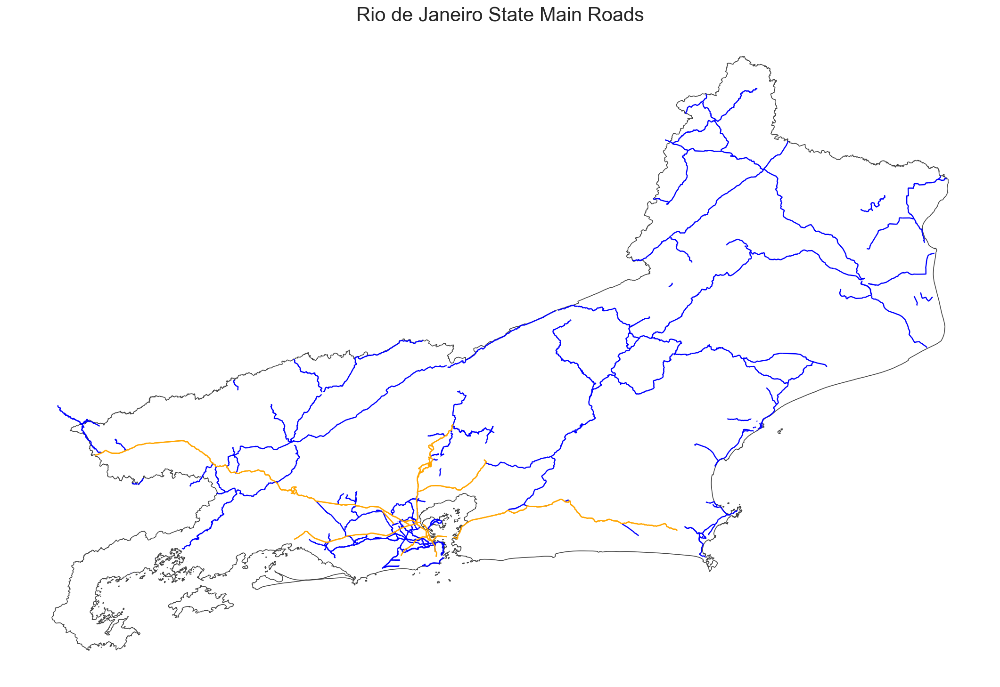

In [79]:
ax = rj_shp.plot(figsize=(18, 16), color='#FFFFFF', edgecolor='#444444')
rj_primary.plot(ax=ax, color="blue", markersize=1)
rj_motorway.plot(ax=ax, color="orange", markersize=1)
plt.title("Rio de Janeiro State Main Roads", fontsize = 20);
plt.axis('off');

## Looking CoronaVirus data

In [96]:
import datetime
date = datetime.datetime.today()

In [97]:
dt.columns

Index(['country', 'state', 'city', 'ibgeID', 'totalCases'], dtype='object')

In [98]:
total_cases = dt.totalCases.sum()

In [99]:
print('Total number of cases in Brasil at {}/{}: {:,}'.format(date.month, date.day, total_cases))

Total number of cases in Brasil at 3/28: 3,474


In [100]:
dt.rename(columns={'ibgeID':'COD. IBGE'}, inplace=True)

In [101]:
cv_city = pd.merge(dt, br_cities, on='COD. IBGE')
cv_city= gpd.GeoDataFrame(cv_city, crs='4326')
cv_city.shape

(266, 14)

In [102]:
print('Total number of cities with reported Covid19 in Brasil at {}/{}: {:,}'.
      format(date.month, date.day, len(cv_city.index)))

Total number of cities with reported Covid19 in Brasil at 3/28: 266


In [103]:
cv_city.head()

,country,state,city,COD. IBGE,totalCases,UF,COD. UF,NOME DO MUNICÍPIO,POPULAÇÃO ESTIMADA,AREA [KMˆ2],geometry,DENS. DEMOG. [hab/kmˆ2],LATITUDE,LONGITUDE
0,Brazil,SP,São Paulo/SP,3550308,1044,SP,35,São Paulo,12252023,"1,810.9","POLYGON ((-46.46934 -23.48106, -46.46885 -23.4...","6,765.71",-23.68230799899996,-46.716985836778605
1,Brazil,RJ,Barra Mansa/RJ,3300407,1,RJ,33,Barra Mansa,184412,640.43,"POLYGON ((-44.30720 -22.45234, -44.30717 -22.4...",287.95,-22.485278402499972,-44.197070044517304
2,Brazil,ES,Vila Velha/ES,3205200,21,ES,32,Vila Velha,493838,239.21,"MULTIPOLYGON (((-40.31092 -20.42071, -40.31087...","2,064.45",-20.427751120999943,-40.3771213574321
3,Brazil,BA,Feira de Santana/BA,2910800,9,BA,29,Feira de Santana,614872,"1,364.93","POLYGON ((-39.25923 -12.24842, -39.26032 -12.2...",450.48,-12.19996647049993,-38.98118948624426
4,Brazil,RJ,Rio de Janeiro/RJ,3304557,431,RJ,33,Rio de Janeiro,6718903,"1,413.47","MULTIPOLYGON (((-43.70288 -22.98523, -43.70286...","4,753.48",-22.93820184949996,-43.4647563997958


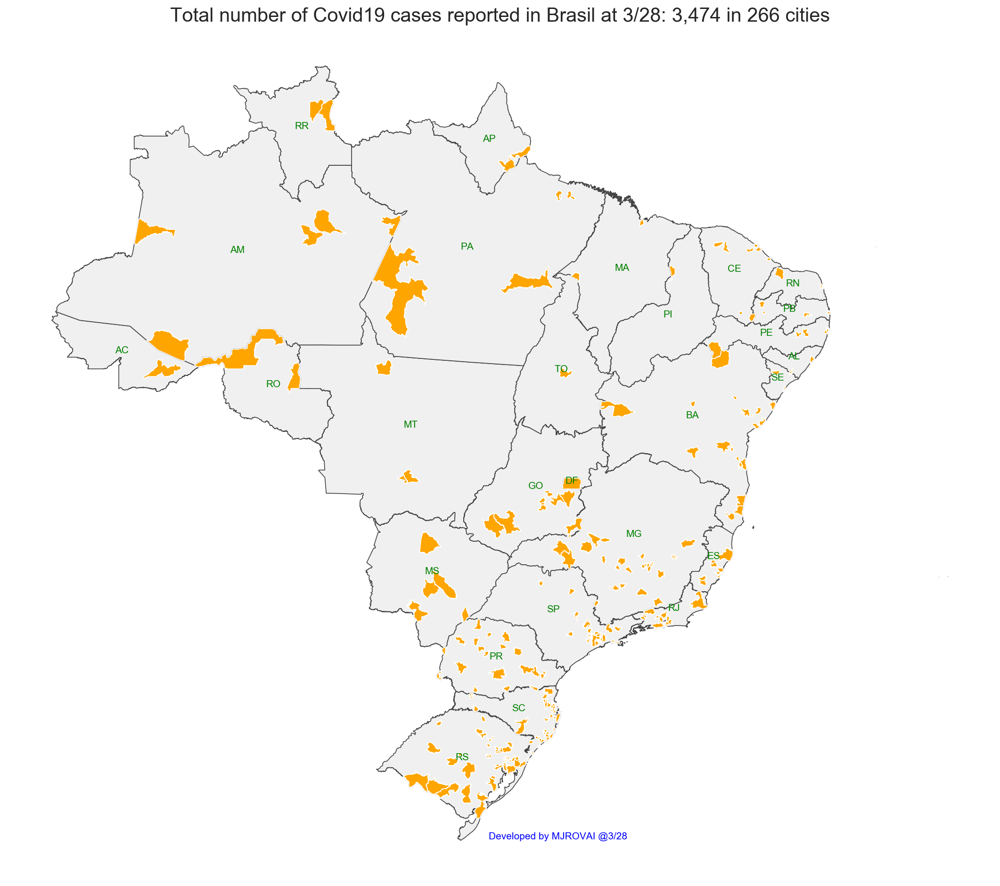

In [104]:
ax = br_state.plot(figsize=(18, 16), color='#F0F0F0', edgecolor='#444444')
cv_city.plot(ax=ax, color="orange", markersize=5, label='City')
plt.title(
    'Total number of Covid19 cases reported in Brasil at {}/{}: {:,} in {} cities'.
    format(date.month, date.day, total_cases, len(cv_city.index)),
    fontsize=20)
plt.axis('off')
for idx, row in br_state.iterrows():
    plt.annotate(s=row['UF'],
                 xy=(row.geometry.centroid.x, row.geometry.centroid.y),
                 horizontalalignment='center',
                 fontsize=10,
                 color='green')
plt.annotate('Developed by MJROVAI @{}/{}'.format(date.month, date.day),
             xy=(-52, -33.7),
             fontsize=10,
             color='blue');

### SP

In [89]:
sp_total_cases = dt[dt.state =='SP'].totalCases.sum()
print('Total number of cases in SP at {}/{}: {:,}'.format(date.month, date.day, sp_total_cases))

Total number of cases in SP at 3/28: 1,223


In [90]:
cv_sp = cv_city.loc[cv_city['UF'] == 'SP'].copy()

In [91]:
print('Total number of cities with reported Covid19 in SP at {}/{}: {:,}'.
      format(date.month, date.day, len(cv_sp.index)))

Total number of cities with reported Covid19 in SP at 3/28: 37


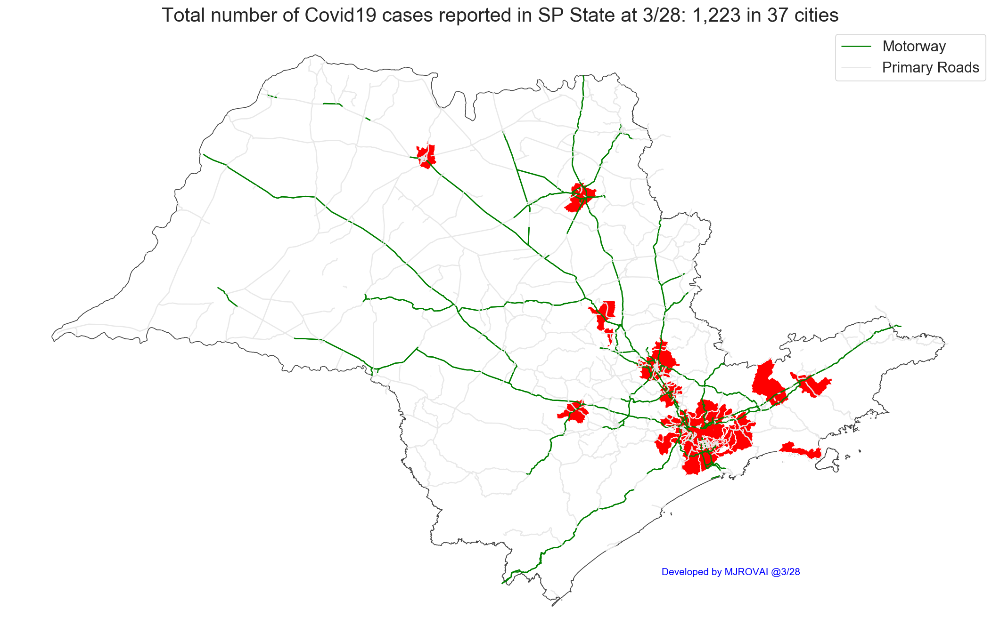

In [92]:
ax = sp_shp.plot(figsize=(18, 16), color='#FFFFFF', edgecolor='#444444')
cv_sp.plot(ax=ax, color="red", markersize=5, label='City')
sp_motorway.plot(ax=ax, color="green", markersize=1, label = 'Motorway')
sp_primary.plot(ax=ax, color="#E8E8E8", markersize=1, label = 'Primary Roads')
plt.title(
    'Total number of Covid19 cases reported in SP State at {}/{}: {:,} in {} cities'.
    format(date.month, date.day, sp_total_cases, len(cv_sp.index)),
    fontsize=20)
plt.axis('off');
ax.legend(fontsize = 15);
plt.annotate('Developed by MJROVAI @{}/{}'.format(date.month, date.day),
             xy=(-47, -25),
             fontsize=10,
             color='blue');

## RJ

In [93]:
rj_total_cases = dt[dt.state =='RJ'].totalCases.sum()
print('Total number of cases in RJ at {}/{}: {:,}'.format(date.month, date.day, rj_total_cases))

Total number of cases in RJ at 3/28: 493


In [94]:
cv_rj = cv_city.loc[cv_city['UF'] == 'RJ'].copy()

print('Total number of cities with reported Covid19 in RJ at {}/{}: {:,}'.
      format(date.month, date.day, len(cv_rj.index)))

Total number of cities with reported Covid19 in RJ at 3/28: 13


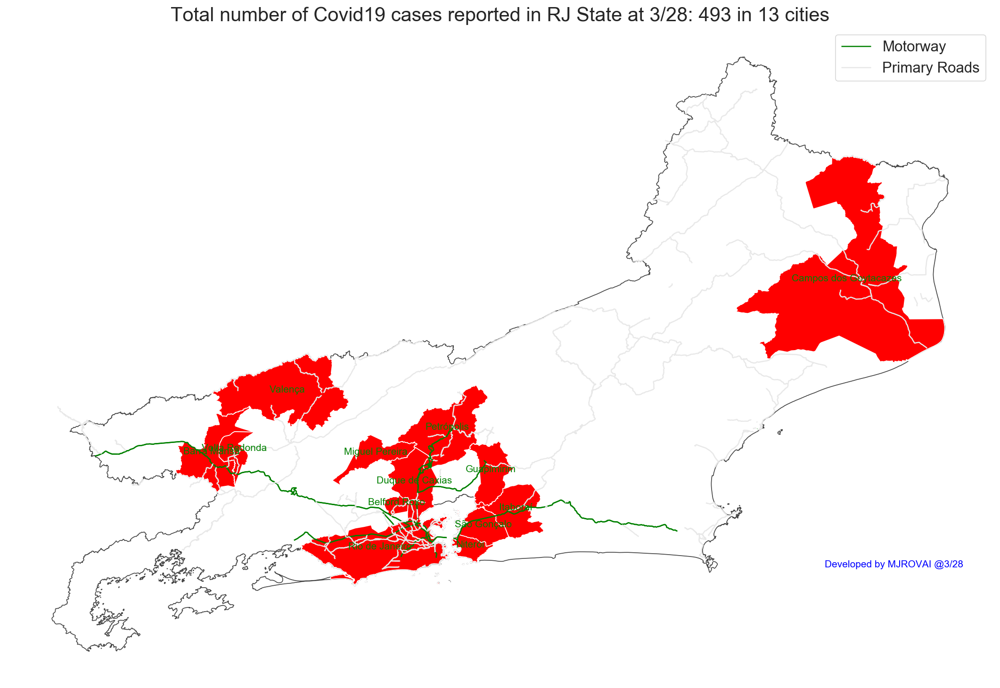

In [95]:
ax = rj_shp.plot(figsize=(18, 16), color='#FFFFFF', edgecolor='#444444')
cv_rj.plot(ax=ax, color="red", markersize=5, label='City')
rj_motorway.plot(ax=ax, color="green", markersize=1, label = 'Motorway')
rj_primary.plot(ax=ax, color="#E8E8E8", markersize=1, label = 'Primary Roads')
plt.title(
    'Total number of Covid19 cases reported in RJ State at {}/{}: {:,} in {} cities'.
    format(date.month, date.day, rj_total_cases, len(cv_rj.index)),
    fontsize=20)
plt.axis('off');
ax.legend(fontsize = 15);
for idx, row in cv_rj.iterrows():
    plt.annotate(s=row['NOME DO MUNICÍPIO'],
                 xy=(row.geometry.centroid.x, row.geometry.centroid.y),
                 horizontalalignment='center',
                 fontsize=10,
                 color='green')
plt.annotate('Developed by MJROVAI @{}/{}'.format(date.month, date.day),
             xy=(-41.5, -23),
             fontsize=10,
             color='blue');

### MG

In [96]:
mg_total_cases = dt[dt.state =='MG'].totalCases.sum()
print('Total number of cases in MG at {}/{}: {:,}'.format(date.month, date.day, mg_total_cases))

Total number of cases in MG at 3/28: 189


In [97]:
cv_mg = cv_city.loc[cv_city['UF'] == 'MG'].copy()

print('Total number of cities with reported Covid19 in MG at {}/{}: {:,}'.
      format(date.month, date.day, len(cv_mg.index)))

Total number of cities with reported Covid19 in MG at 3/28: 24


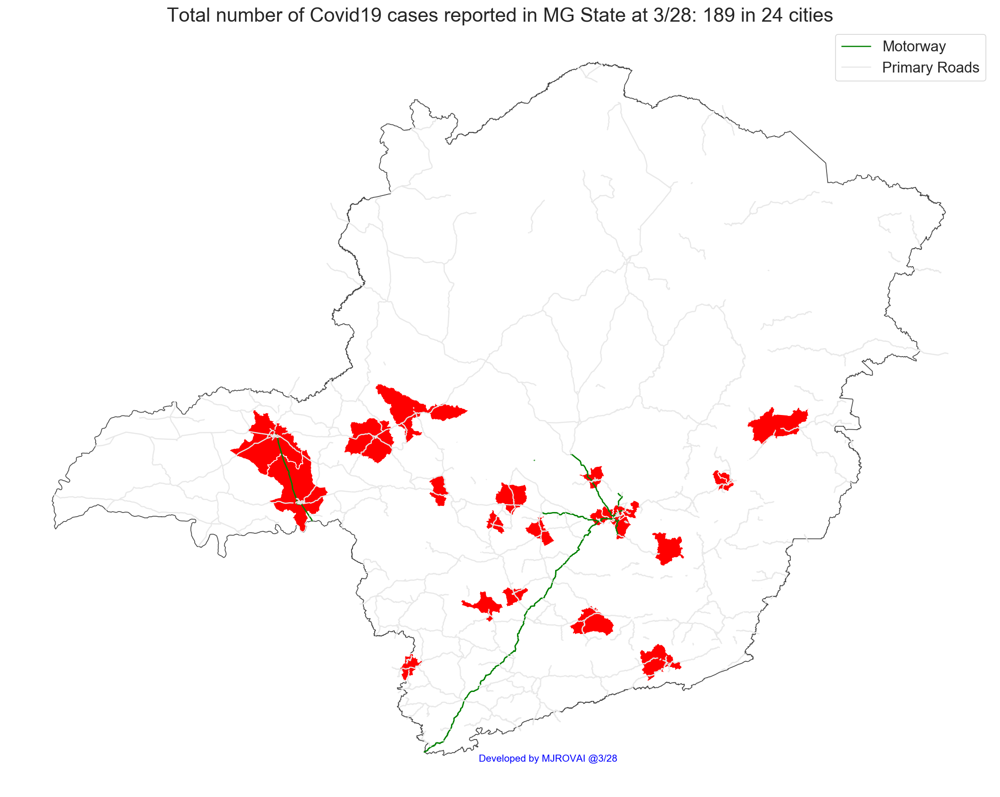

In [98]:
ax = mg_shp.plot(figsize=(18, 16), color='#FFFFFF', edgecolor='#444444')
cv_mg.plot(ax=ax, color="red", markersize=5, label='City')
mg_motorway.plot(ax=ax, color="green", markersize=1, label = 'Motorway')
mg_primary.plot(ax=ax, color="#E8E8E8", markersize=1, label = 'Primary Roads')
plt.title(
    'Total number of Covid19 cases reported in MG State at {}/{}: {:,} in {} cities'.
    format(date.month, date.day, mg_total_cases, len(cv_mg.index)),
    fontsize=20)
plt.axis('off');
ax.legend(fontsize = 15);
plt.annotate('Developed by MJROVAI @{}/{}'.format(date.month, date.day),
             xy=(-45.7, -23),
             fontsize=10,
             color='blue');

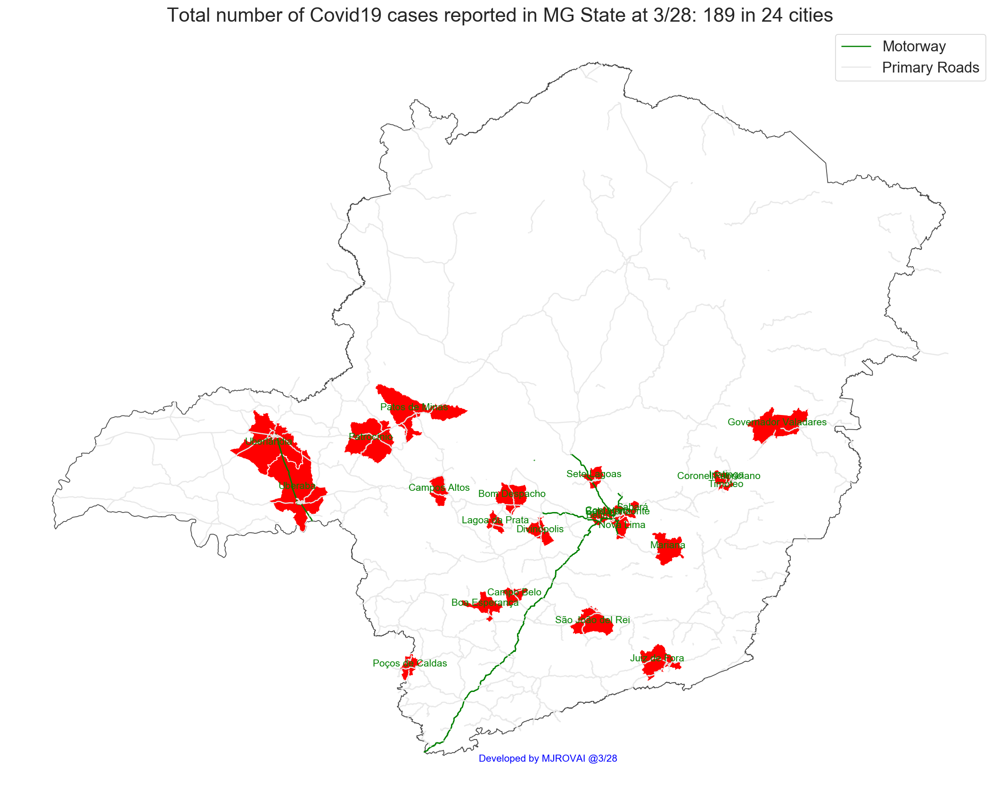

In [99]:
ax = mg_shp.plot(figsize=(18, 16), color='#FFFFFF', edgecolor='#444444')
cv_mg.plot(ax=ax, color="red", markersize=5, label='City')
mg_motorway.plot(ax=ax, color="green", markersize=1, label = 'Motorway')
mg_primary.plot(ax=ax, color="#E8E8E8", markersize=1, label = 'Primary Roads')
plt.title(
    'Total number of Covid19 cases reported in MG State at {}/{}: {:,} in {} cities'.
    format(date.month, date.day, mg_total_cases, len(cv_mg.index)),
    fontsize=20)
plt.axis('off');
ax.legend(fontsize = 15);
for idx, row in cv_mg.iterrows():
    plt.annotate(s=row['NOME DO MUNICÍPIO'],
                 xy=(row.geometry.centroid.x, row.geometry.centroid.y),
                 horizontalalignment='center',
                 fontsize=10,
                 color='green')
plt.annotate('Developed by MJROVAI @{}/{}'.format(date.month, date.day),
             xy=(-45.7, -23),
             fontsize=10,
             color='blue');

In [100]:
dt_mg = cv_mg.sort_values('totalCases', ascending=False).copy()
dt_mg = dt_mg[[
    'NOME DO MUNICÍPIO', 'UF', 'POPULAÇÃO ESTIMADA', 'AREA [KMˆ2]',
    'DENS. DEMOG. [hab/kmˆ2]', 'totalCases'
]]
dt_mg

,NOME DO MUNICÍPIO,UF,POPULAÇÃO ESTIMADA,AREA [KMˆ2],DENS. DEMOG. [hab/kmˆ2],totalCases
40,Belo Horizonte,MG,2512070,374.55,"6,706.9",118
48,Nova Lima,MG,94889,485.91,195.28,13
27,Juiz de Fora,MG,568873,"1,662.65",342.15,11
50,Uberlândia,MG,691305,"4,601.42",150.24,7
8,Divinópolis,MG,238230,802.55,296.84,6
158,Betim,MG,439340,388.85,"1,129.84",4
161,Contagem,MG,663855,220.4,"3,012.05",3
70,Uberaba,MG,333783,"5,092.62",65.54,3
113,Mariana,MG,60724,"1,357.03",44.75,2
49,Sete Lagoas,MG,239639,603.02,397.4,2


### Brasil Total cases

In [105]:
cv_city_pnt= cv_city.copy()
cv_city_pnt['geometry'] = cv_city_pnt['geometry'].representative_point()

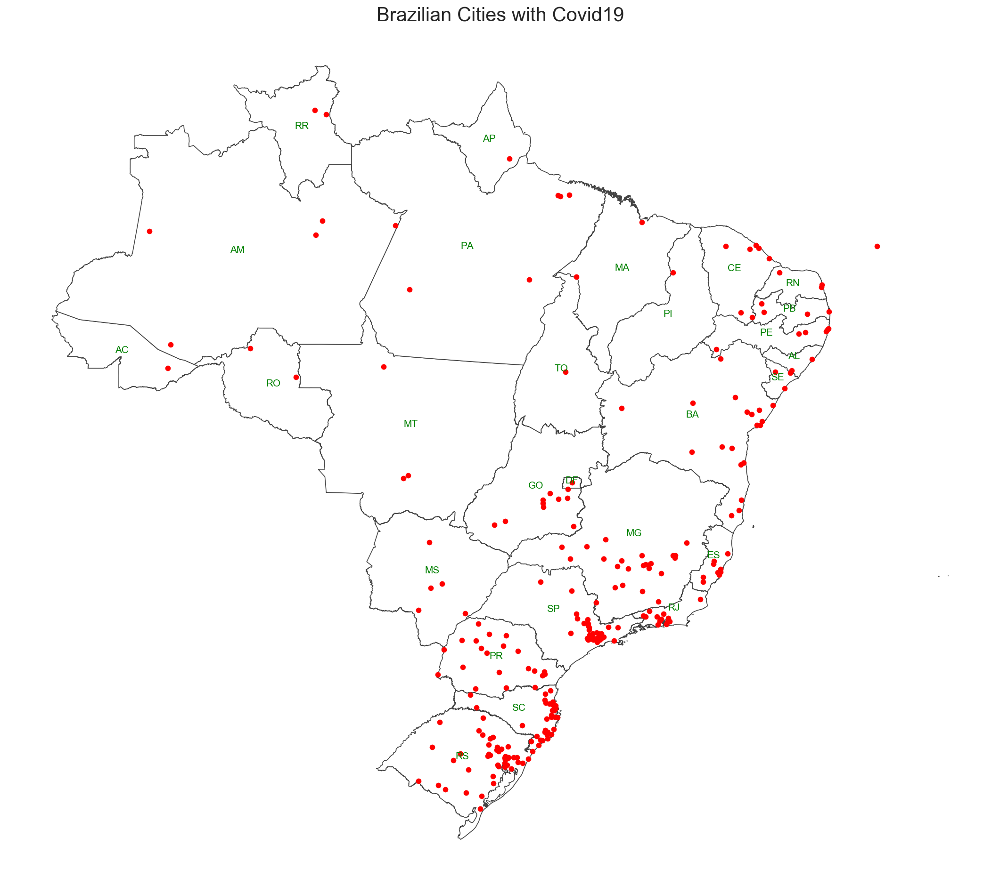

In [106]:
ax = br_state.plot(figsize=(18, 16), color='#FFFFFF', edgecolor='#444444')
cv_city_pnt.plot(ax=ax, color='red')
plt.title("Brazilian Cities with Covid19", fontsize = 20);
plt.axis('off');
for idx, row in br_state.iterrows():
    plt.annotate(s=row['UF'], xy=(row.geometry.centroid.x, row.geometry.centroid.y),
                 horizontalalignment='center', fontsize=10, color='green');

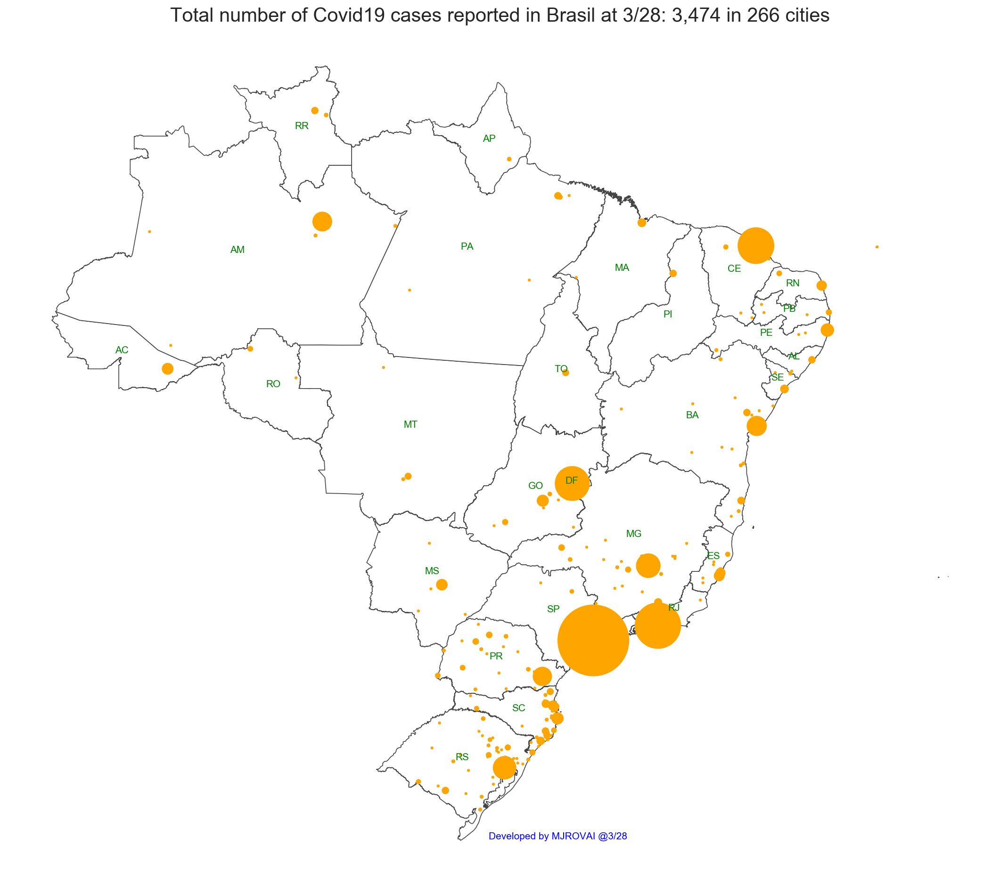

In [107]:
ax = br_state.plot(figsize=(18, 16), color='#FFFFFF', edgecolor='#444444')
cv_city_pnt.plot(ax=ax, color='orange', markersize=5*cv_city_pnt.totalCases)
plt.title(
    'Total number of Covid19 cases reported in Brasil at {}/{}: {:,} in {} cities'.
    format(date.month, date.day, total_cases, len(cv_city.index)),
    fontsize=20)
plt.axis('off');
for idx, row in br_state.iterrows():
    plt.annotate(s=row['UF'], xy=(row.geometry.centroid.x, row.geometry.centroid.y),
                 horizontalalignment='center', fontsize=10, color='green');
plt.annotate('Developed by MJROVAI @{}/{}'.format(date.month, date.day),
         xy=(-52, -33.7),
         fontsize=10,
         color='blue');

In [108]:
dtest = cv_city_pnt.sort_values('totalCases', ascending=False).copy()
dtest = dtest[[
    'NOME DO MUNICÍPIO', 'UF', 'POPULAÇÃO ESTIMADA', 'AREA [KMˆ2]',
    'DENS. DEMOG. [hab/kmˆ2]', 'totalCases'
]]

In [109]:
dtest.rename(columns={'totalCases':'TOTAL CASOS'}, inplace=True)

In [110]:
dtest[:20]

,NOME DO MUNICÍPIO,UF,POPULAÇÃO ESTIMADA,AREA [KMˆ2],DENS. DEMOG. [hab/kmˆ2],TOTAL CASOS
0,São Paulo,SP,12252023,"1,810.9","6,765.71",1044
4,Rio de Janeiro,RJ,6718903,"1,413.47","4,753.48",431
36,Fortaleza,CE,2669342,313.77,"8,507.32",268
5,Brasília,DF,3015268,"6,217.88",484.94,242
40,Belo Horizonte,MG,2512070,374.55,"6,706.9",118
11,Porto Alegre,RS,1483771,660.68,"2,245.82",107
22,Salvador,BA,2872347,729.83,"3,935.64",78
23,Manaus,AM,2182763,"11,425.25",191.05,75
14,Curitiba,PR,1933105,533.15,"3,625.82",71
9,Niterói,RJ,513584,157.5,"3,260.85",36


In [107]:
dtest.to_excel('../data/CV_City_Mar28.xlsx')

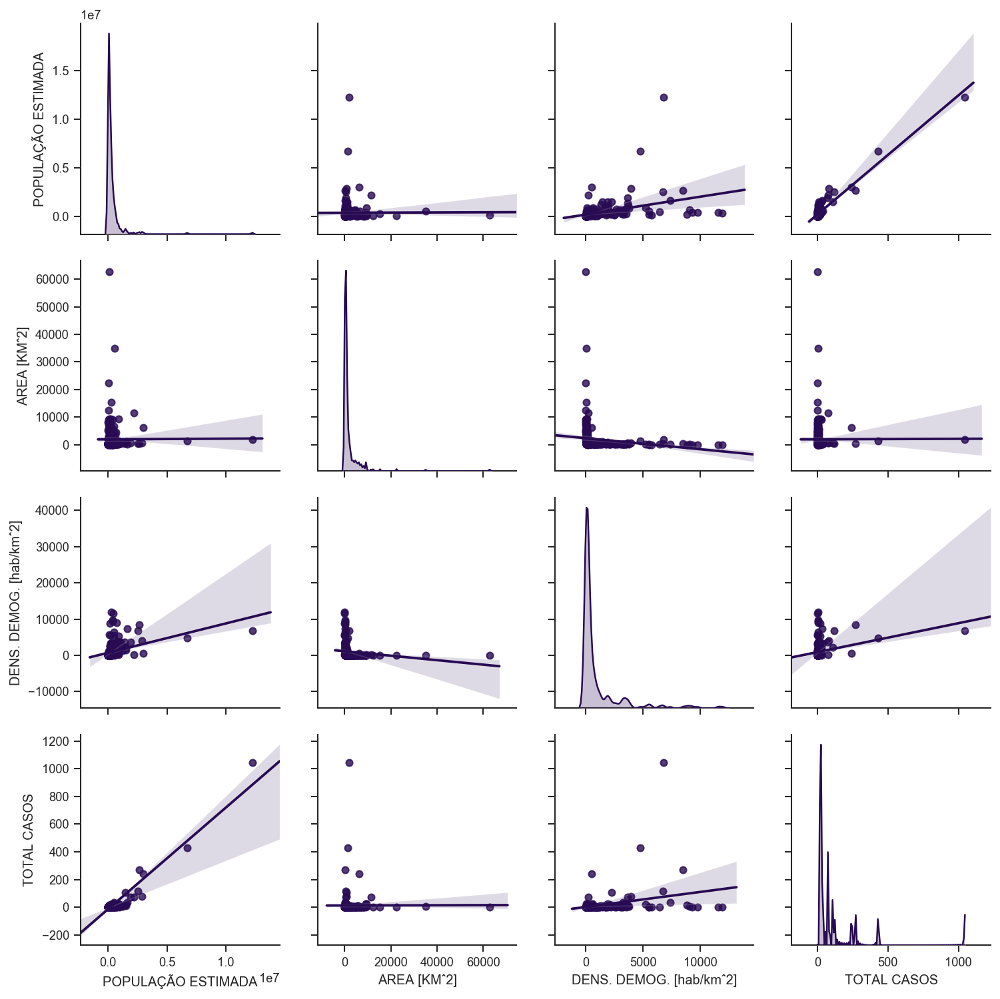

In [111]:
sns.pairplot(dtest, diag_kind="kde", kind="reg");

## Airports

In [132]:
lst_intl_airports = ['Belém',
'Confins',
'Brasília',
'Cabo Frio',
'Campinas',
'Campo Grande',
'Várzea Grande',
'São José dos Pinhais',
'Florianópolis',
'Fortaleza',
'Foz do Iguaçu',
'Guarulhos',
'Maceió',
'Manaus',
'São Gonçalo do Amarante',
'Porto Alegre',
'Recife',
'Rio de Janeiro',
'Salvador',
'São Carlos']

In [133]:
len(lst_intl_airports)

20

In [134]:
br_intl_airports = br_cities_pnt[br_cities_pnt['NOME DO MUNICÍPIO'].isin(lst_intl_airports)]
print(len(br_intl_airports.index))

26


In [135]:
br_intl_airports['NOME DO MUNICÍPIO']

111                      Manaus
169                       Belém
887               Várzea Grande
949                   Fortaleza
1052    São Gonçalo do Amarante
1205    São Gonçalo do Amarante
1268                      Belém
1596                     Recife
1657                      Belém
1665               Campo Grande
1696                     Maceió
2162                   Salvador
2440                    Confins
3186                  Cabo Frio
3242             Rio de Janeiro
3375                   Campinas
3479                  Guarulhos
3813                 São Carlos
4030              Foz do Iguaçu
4261       São José dos Pinhais
4398              Florianópolis
4550                 São Carlos
4931               Porto Alegre
5122               Campo Grande
5316              Várzea Grande
5569                   Brasília
Name: NOME DO MUNICÍPIO, dtype: object

In [136]:
br_intl_airports.reset_index(drop = True, inplace = True)
br_intl_airports

,UF,COD. UF,NOME DO MUNICÍPIO,COD. IBGE,POPULAÇÃO ESTIMADA,AREA [KMˆ2],DENS. DEMOG. [hab/kmˆ2],LATITUDE,LONGITUDE,geometry
0,AM,13,Manaus,1302603,2182763,"11,425.25",191.05,-2.5754933434999714,-60.37034755432839,POINT (-60.37035 -2.57549)
1,PA,15,Belém,1501402,1492745,"1,059.97","1,408.29",-1.272657498999962,-48.50221449190654,POINT (-48.50221 -1.27266)
2,PI,22,Várzea Grande,2211407,4391,240.12,18.29,-6.554178379999968,-42.23079663626099,POINT (-42.23080 -6.55418)
3,CE,23,Fortaleza,2304400,2669342,313.77,"8,507.32",-3.789988753999978,-38.526342154532465,POINT (-38.52634 -3.78999)
4,CE,23,São Gonçalo do Amarante,2312403,48422,837.17,57.84,-3.5884029799999553,-39.044722073015016,POINT (-39.04472 -3.58840)
5,RN,24,São Gonçalo do Amarante,2412005,102400,252.35,405.79,-5.7729301819999534,-35.358961479538806,POINT (-35.35896 -5.77293)
6,PB,25,Belém,2501906,17676,101.53,174.1,-6.710268013999951,-35.509061951936815,POINT (-35.50906 -6.71027)
7,PE,26,Recife,2611606,1645727,223.18,"7,373.99",-8.042073098999964,-34.92821921506244,POINT (-34.92822 -8.04207)
8,AL,27,Belém,2700805,4344,68.53,63.39,-9.554483774999966,-36.496168266035816,POINT (-36.49617 -9.55448)
9,AL,27,Campo Grande,2701506,9558,175.2,54.55,-9.96475047499996,-36.74394033122053,POINT (-36.74394 -9.96475)


In [137]:
# Eliminate cities duplicated (same name, diferent states)
br_intl_airports = br_intl_airports.drop(br_intl_airports.index[[2, 4, 6, 8, 9, 21]])

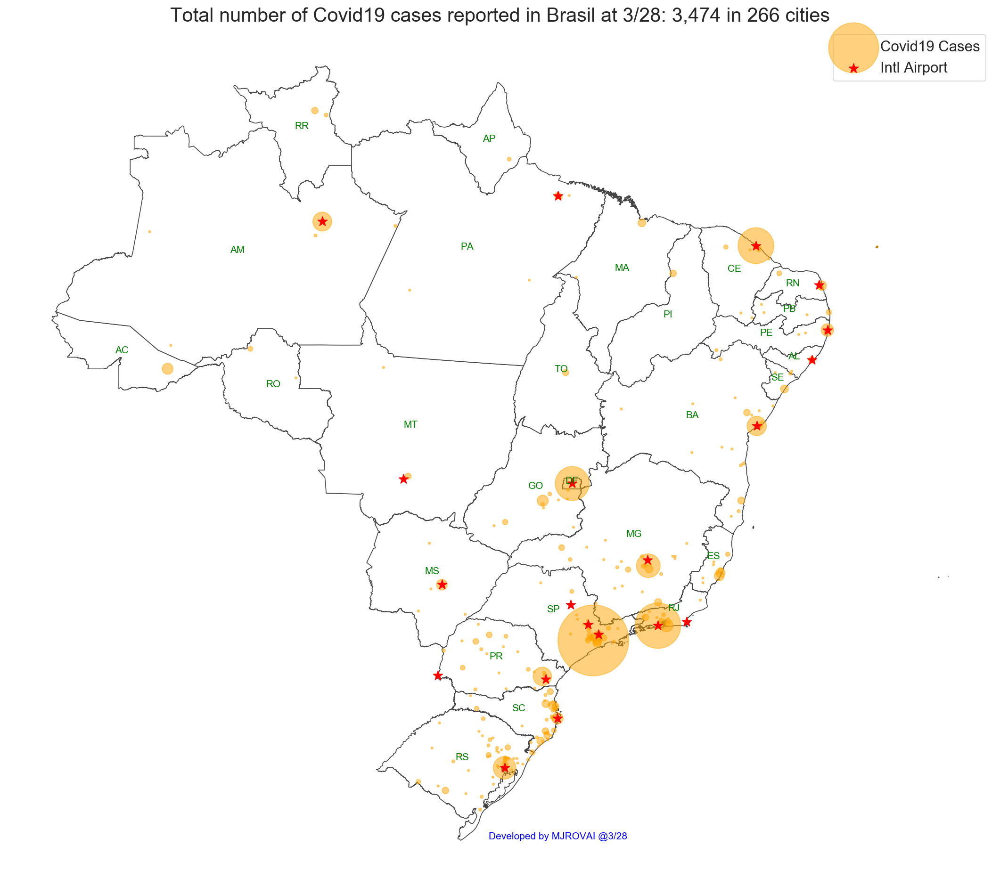

In [147]:
ax = br_state.plot(figsize=(18, 16), color='#FFFFFF', edgecolor='#444444')
cv_city_pnt.plot(ax=ax,
                 color='orange',
                 markersize=5 * cv_city_pnt.totalCases,
                 alpha=.5,
                 label='Covid19 Cases')
br_intl_airports.plot(ax=ax,
                      color='red',
                      marker='*',
                      markersize=100,
                      label='Intl Airport')
plt.title(
    'Total number of Covid19 cases reported in Brasil at {}/{}: {:,} in {} cities'
    .format(date.month, date.day, total_cases, len(cv_city.index)),
    fontsize=20)
plt.axis('off')
ax.legend(fontsize=15)
for idx, row in br_state.iterrows():
    plt.annotate(s=row['UF'],
                 xy=(row.geometry.centroid.x, row.geometry.centroid.y),
                 horizontalalignment='center',
                 fontsize=10,
                 color='green')
plt.annotate('Developed by MJROVAI @{}/{}'.format(date.month, date.day),
             xy=(-52, -33.7),
             fontsize=10,
             color='blue')